<a href="https://colab.research.google.com/github/aglie/iucr2020_compschool/blob/main/arkadiy_eigenvalues_101/Exercise_3_Singular_Value_Decomposition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pylab inline

Populating the interactive namespace from numpy and matplotlib


# Generate some data

The following bit of code generates some noisy data we could then use for cleaning using matrix rank reduction via Singular Value Decomposition.


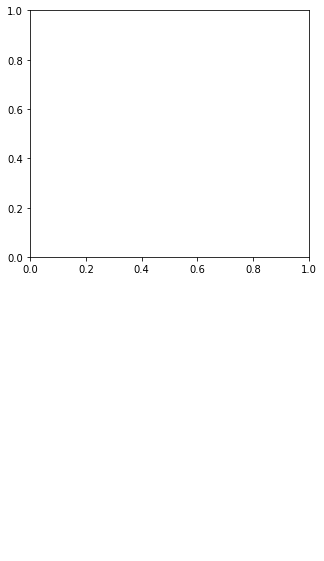

In [ ]:
import matplotlib.animation as animation # Import matplotlib.animation function
rc('animation', html='jshtml') 

fig, ax = subplots(2,1,figsize = (5, 10))
axis('off')

r0 = [[-1,1],  [1,-1]]
v0 = [[1,1], [-1, -1]]
springs = [{'i1': 0, 'i2': 1, 'k': 0.7, 'l': sqrt(2)*2*1.1}]

def make_one_step(r, v):
    """Make one iteration of orbiting points"""

    dv = v*0
    for spring in springs:
        i1 = spring['i1']
        i2 = spring['i2']
        k = spring['k']
        l0 = spring['l']

        #use a straightforward finite difference 
        #iteration (algorithm is unstable!)
        vec = r[i2] - r[i1]
        nvec = norm(vec)
        vec = vec/norm(vec)
        dl = nvec-l0
        f = dl*k*vec

        dv[i1] += f
        dv[i2] -= f

    r[()] = r+v*dt
    v[()] = v+dv*dt

x = linspace(-4, 4, 100)

def project_atoms(r):
    """Generate 1D signal from the position of our orbiting points"""
    sigma = 0.5
    projection = x*0
    for at in range(2):
        projection += exp(-(x-r[at,0])**2/sigma**2)
    return projection


In [ ]:
reference_data = []

dt=0.025

r=array(r0, dtype=float)
v=array(v0, dtype=float)*0.3

def frame(frame_number):
    for _ in range(7):
        make_one_step(r, v)

    ax[0].clear()
    ax[1].clear()
    
    ax[0].plot(r[:,0], r[:,1], '-', color=ones(3)*0.8)
    ax[0].plot(r[:,0], r[:,1], '.', color='black', markersize = 10)

    ax[0].axis([-4,4,-4,4])
    ax[0].axis('off')

    projection = project_atoms(r)
    
    ax[1].plot(x, projection)
    ax[1].axis([-4,4,0,2.5])

    reference_data.append(projection)

anim = animation.FuncAnimation(fig, frame, frames=500, repeat=True, 
                                interval=30)



# Show data

In [ ]:
anim

In [ ]:
#After you run the above code, you have the following variables:

# x variable for plot drawing
x

#reference data, without any noise:
reference_data

#data with "measurement" noise
noise_level = 0.4
data = reference_data + random.normal(loc=0.0, scale=noise_level, size=shape(reference_data))

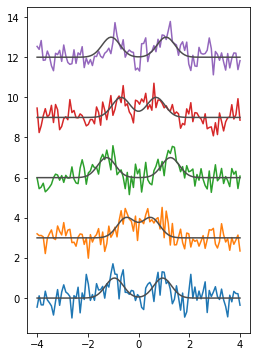

In [ ]:
# Show some samples of noisy data
figsize(4, 6)
for i in range(5):
  plot(x, data[i*100] + i*3) # plot several samples from the data
  plot(x, reference_data[i*100] + i*3, color=ones(3)*0.3) # and reference in dark gray

In [ ]:
#Notice, that this time our matrix is not diagonal, moreover it is not even square:
data.shape

(502, 100)

In [ ]:
# This is ok, SVD allows to work on non suqare matrices since
# it is related to eigenfunctions of a square matrix dot(data.T, data)
# but you don't have to care about this since the following line will
# take care of all of this:

u, s, vh = svd(data, full_matrices=False)

# Task 1:

Explore the results of `SVD` function: `u`, `s` and `vh`. Remember, `vh` contain the direction of the most significant variation in data, `s` are the singular values of the decomposition, and their magnitude is characteristic of whether this variable conveys signal or noise, `u` contain evolution of the corresponding degrees of freedom with time.

Plot `s` and most significant vectors from `u` and `vh`.

## Solution

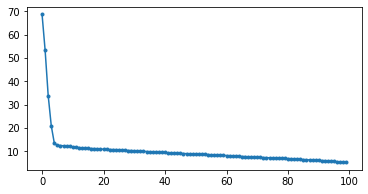

In [ ]:
figsize(6,3)
plot(s,'.-')

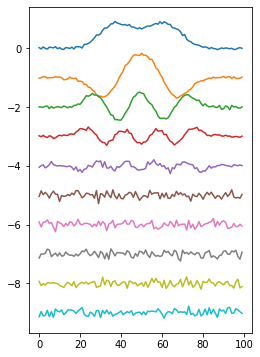

In [ ]:
figsize(4,6)
for i in range(0,10):
    plot(vh[i,:]*s[i]/s[0]*5-i)

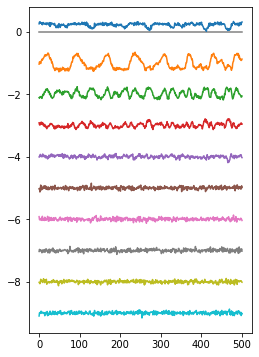

In [ ]:
plot(u[:,0]*0, color='gray') #show a baseline for the first significant variable
for i in range(0,10):
    plot(u[:,i]*s[i]/s[0]*5-i)

# Task 2: data cleaning

Now data can be cleaned from the noise but reducing the variations along the variables which show only noise. In our case only the first 5 singular values seem to be related to signal, keep only them, and construct a cleaned version of the data using the matrices `u`, `s_clean` and `vh`.



## Solution


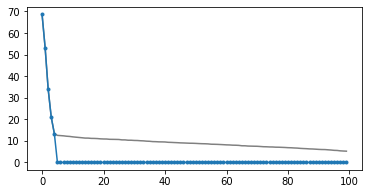

In [ ]:
s_clean = s.copy()
s_clean[5:] = 0 #set all parameters starting from 5 to zero

figsize(6,3)
plot(s, color='gray')
plot(s_clean,'.-')

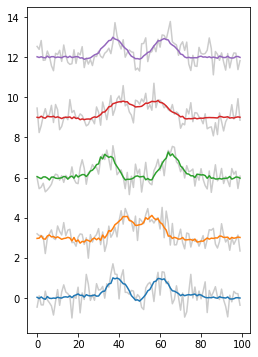

In [ ]:
# after s is cleaned synthesis is simply    u s_clean vh 
# where s_clean should be a diagonal matrix
cleaned_data = dot(u, dot(diag(s_clean), vh)) 

figsize(4, 6)
for i in range(5):
  plot(data[i*100]+3*i, color=ones(3)*0.8)
  plot(cleaned_data[i*100]+3*i)

# Task 3: clear vector which wasn't part of SVD

After SVD decomposition, it is possible to use the obtained matrices `s_prime` and `vh` to clean a vector which was not part of the original SVD. For instance, when you have performed SVD on a portion of data, and want to verify the model on the samples which were not part of that procedure.

Below you will five vectors which are not part of the original dataset, try to clean them with the results of the previous steps

In [ ]:
vectors_to_clean = reference_data[::100] #get a subset of samples
vectors_to_clean += random.normal(loc=0.0, scale=noise_level, size=shape(vectors_to_clean)) #add new noise


#clean_vectors = ... fill this part

for i in range(vectors_to_clean.shape[0]):
    plot(vectors_to_clean[i]+3*i, color=ones(3)*0.8)
    plot(cleaned_data[i]+3*i)


# Solution


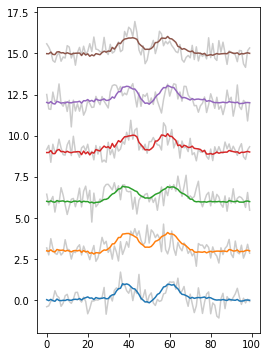

In [ ]:
vectors_to_clean = reference_data[::100] #get a subset of samples
vectors_to_clean += random.normal(loc=0.0, scale=noise_level, size=shape(vectors_to_clean)) #add new noise

clean_vectors = dot(dot(vectors_to_clean, vh.T), dot(diag(reduced>0), vh))

for i in range(vectors_to_clean.shape[0]):
    plot(vectors_to_clean[i]+3*i, color=ones(3)*0.8)
    plot(cleaned_data[i]+3*i)
